In [1]:
import ee
ee.Initialize()

In [2]:
import altair as alt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2850]:
from src.ndvi import get_ndvi_ppt_tempt_pasture

In [7]:
ndvi_ppt_tempt_pasture_pasture2 = get_ndvi_ppt_tempt_pasture(2)

In [2847]:
ndvi_ppt_tempt_pasture_pasture2

,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,NDVI_scaled,GDD_scaled
0,19810101,-96.995817,44.240366,347112000000,-1.088,2.786,-4.963,0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,NaN,0.000000
1,19810102,-96.995817,44.240366,347198400000,-5.28,1.035,-11.595,0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,NaN,0.000000
2,19810103,-96.995817,44.240366,347284800000,-10.078,2.153,-22.309999,0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,NaN,0.000000
3,19810104,-96.995817,44.240366,347371200000,-17.269001,-12.532,-22.006001,0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,NaN,0.000000
4,19810105,-96.995817,44.240366,347457600000,-10.875001,-6.448,-15.302,0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15538,20230718,-96.995817,44.240366,1689595200000,16.9524,22.5282,11.3768,0,2023-07-17,2023,7,17,198,NaN,11.952400,1194.623461,NaN,11.946235
15539,20230719,-96.995817,44.240366,1689681600000,20.289099,25.7759,14.8025,0.461,2023-07-18,2023,7,18,199,NaN,15.289099,1209.912560,NaN,12.099126
15540,20230720,-96.995817,44.240366,1689768000000,21.441299,29.261398,13.6213,0,2023-07-19,2023,7,19,200,NaN,16.441299,1226.353859,NaN,12.263539
15541,20230721,-96.995817,44.240366,1689854400000,18.932299,24.910398,12.9543,0,2023-07-20,2023,7,20,201,NaN,13.932299,1240.286158,NaN,12.402862


In [10]:
# ndvi_ppt_tempt_pasture_pasture2.to_csv('./pasture2.csv')

In [2844]:
# scale for better visualization 
time_period = slice(15000,20000)
ndvi_ppt_tempt_pasture_pasture2['NDVI_scaled'] = ndvi_ppt_tempt_pasture_pasture2['NDVI'] * 100
ndvi_ppt_tempt_pasture_pasture2['GDD_scaled'] = ndvi_ppt_tempt_pasture_pasture2['GDD']/100
tmean = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[time_period]).mark_bar(color='red',size=.2).encode(
alt.X("Timestamp:T"), alt.Y("tmean:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('tmean:Q', title='tmean')]
)

precip = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[time_period]).mark_bar(color='blue',size=1).encode(
    alt.X("Timestamp:T"), alt.Y("ppt:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('ppt:Q', title='ppt')]
)

ndvi = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[time_period]).mark_point(color='black',size=5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI_scaled:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)

GDD = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[time_period]).mark_point(size=1).encode(
alt.X("Timestamp:T"), alt.Y("GDD_scaled:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('GDD:Q', title='GDD')]
)



(tmean + precip + ndvi + GDD).properties(width=2000, height=500)

alt.LayerChart(...)

In [2848]:
df0 = ndvi_ppt_tempt_pasture_pasture2.sort_values('Timestamp').set_index('Timestamp')[['ppt','tmean','tmax','tmin','GDD','NDVI','DOY']]

In [11]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [169]:
ndvi_ppt_tempt_pasture_pasture2['NDVI_interpolated'] = ndvi_ppt_tempt_pasture_pasture2[['NDVI']].interpolate(method="linear")

In [170]:
ndvi_interpolated = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[10000:12000]).mark_point(color='blue',size=.5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI_interpolated:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI_interpolated:Q', title='NDVI_interpolated')]
)
ndvi_unscaled = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[10000:12000]).mark_bar(color='black',size=.5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
(ndvi_unscaled + ndvi_interpolated).properties(width=1000, height=500)

alt.LayerChart(...)

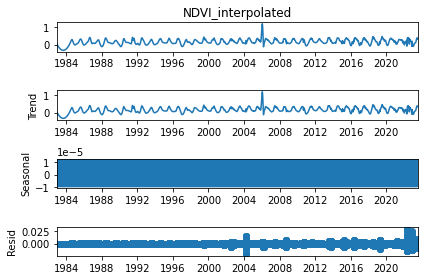

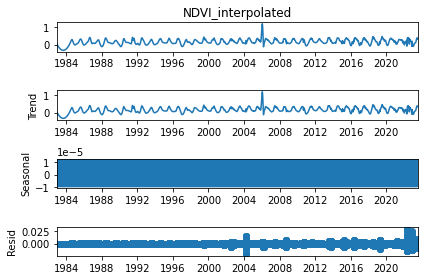

In [61]:
df = ndvi_ppt_tempt_pasture_pasture2.set_index('Timestamp')
res = seasonal_decompose(df['NDVI_interpolated'].dropna())
res.plot()


In [66]:
from sklearn.impute import SimpleImputer 

In [87]:
from sklearn.impute import KNNImputer

In [67]:
imputer = SimpleImputer(strategy="median")

In [94]:
imputer_knn = KNNImputer()

In [100]:
ndvi = ndvi_ppt_tempt_pasture_pasture2[['NDVI']]

In [101]:
imputer_knn.fit(ndvi)

KNNImputer()

In [72]:
imputer.fit(data_num)

SimpleImputer(strategy='median')

In [73]:
imputer.statistics_

array([2.00200000e+03, 6.00000000e+00, 1.60000000e+01, 1.81000000e+02,
       2.18020644e-01, 2.57750034e+00, 8.27738059e+02, 2.18020644e+01,
       8.27738059e+00, 1.35122600e-01])

In [102]:
X = imputer_knn.transform(ndvi)

In [107]:
ndvi_tr = pd.DataFrame(X,columns=['NDVI']) # restore the dataframe

In [109]:
ndvi_tr['Timestamp'] = ndvi_ppt_tempt_pasture_pasture2['Timestamp']

In [178]:
ndvi_interpolated = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[10000:15000]).mark_point(color='blue',size=.5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI_interpolated:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI_interpolated:Q', title='NDVI_interpolated')]
)
ndvi_unscaled = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[10000:15000]).mark_line(color='black',size=1).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI_filled:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
(ndvi_interpolated + ndvi_unscaled).properties(width=1000, height=500)

alt.LayerChart(...)

In [391]:
ndvi_ppt_tempt_pasture_pasture2['NDVI_filled_fb'] = ndvi_ppt_tempt_pasture_pasture2[['NDVI']].ffill()

In [392]:
ndvi_ppt_tempt_pasture_pasture2['NDVI_filled_fb'] = ndvi_ppt_tempt_pasture_pasture2[['NDVI_filled_fb']].bfill()

In [176]:
ndvi_ppt_tempt_pasture_pasture2['NDVI_filled_fb'] = ndvi_ppt_tempt_pasture_pasture2[['NDVI_filled']].bfill()

In [393]:
ndvi_ppt_tempt_pasture_pasture2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15542 entries, 0 to 15541
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              15542 non-null  object        
 1   longitude       15542 non-null  object        
 2   latitude        15542 non-null  object        
 3   time            15542 non-null  object        
 4   tmean           15542 non-null  object        
 5   tmax            15542 non-null  object        
 6   tmin            15542 non-null  object        
 7   ppt             15542 non-null  object        
 8   Timestamp       15542 non-null  datetime64[ns]
 9   Year            15542 non-null  int64         
 10  Month           15542 non-null  int64         
 11  Day             15542 non-null  int64         
 12  DOY             15542 non-null  int64         
 13  NDVI            564 non-null    float64       
 14  GD              15542 non-null  float64       
 15  GD

In [179]:
ndvi_ppt_tempt_pasture_pasture2

,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,NDVI_scaled,GDD_scaled,NDVI_interpolated,NDVI_filled
0,19810101,-96.995817,44.240366,347112000000,-1.088,2.786,-4.963,0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,NaN,0.000000,NaN,0.048060
1,19810102,-96.995817,44.240366,347198400000,-5.28,1.035,-11.595,0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,NaN,0.000000,NaN,0.048060
2,19810103,-96.995817,44.240366,347284800000,-10.078,2.153,-22.309999,0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,NaN,0.000000,NaN,0.048060
3,19810104,-96.995817,44.240366,347371200000,-17.269001,-12.532,-22.006001,0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,NaN,0.000000,NaN,0.048060
4,19810105,-96.995817,44.240366,347457600000,-10.875001,-6.448,-15.302,0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,NaN,0.000000,NaN,0.048060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15535,20230715,-96.995817,44.240366,1689336000000,21.465199,27.827099,15.103499,0,2023-07-14,2023,7,14,195,NaN,16.465199,1158.464663,NaN,11.584647,0.349057,0.355580
15536,20230716,-96.995817,44.240366,1689422400000,18.3174,24.317699,12.3173,0,2023-07-15,2023,7,15,196,NaN,13.317400,1171.782063,NaN,11.717821,0.347970,0.355580
15537,20230717,-96.995817,44.240366,1689508800000,16.132099,23.4783,8.786,0,2023-07-16,2023,7,16,197,0.346883,11.132099,1182.914162,34.688263,11.829142,0.346883,0.346883
15538,20230718,-96.995817,44.240366,1689595200000,16.972599,22.364199,11.5812,0,2023-07-17,2023,7,17,198,NaN,11.972599,1194.886761,NaN,11.948868,0.346883,0.346883


In [229]:

df_mean

,DOY,mean_NDVI
0,1,0.084375
1,2,0.083244
2,3,0.082114
3,4,0.079855
4,5,0.077596
...,...,...
361,362,0.092932
362,363,0.101052
363,364,0.063875
364,365,0.063875


In [ ]:
ndvi_ppt_tempt_pasture_pasture2_filled = ndvi_ppt_tempt_pasture_pasture2.merg(df,on='DOY')

# LSTM Analysis

In [2789]:
ndvi_ppt_tempt_pasture_pasture2

,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,NDVI_scaled,GDD_scaled
0,19810101,-96.995817,44.240366,347112000000,-1.088,2.786,-4.963,0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,NaN,0.000000
1,19810102,-96.995817,44.240366,347198400000,-5.28,1.035,-11.595,0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,NaN,0.000000
2,19810103,-96.995817,44.240366,347284800000,-10.078,2.153,-22.309999,0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,NaN,0.000000
3,19810104,-96.995817,44.240366,347371200000,-17.269001,-12.532,-22.006001,0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,NaN,0.000000
4,19810105,-96.995817,44.240366,347457600000,-10.875001,-6.448,-15.302,0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15538,20230718,-96.995817,44.240366,1689595200000,16.9524,22.5282,11.3768,0,2023-07-17,2023,7,17,198,NaN,11.952400,1194.623461,NaN,11.946235
15539,20230719,-96.995817,44.240366,1689681600000,20.289099,25.7759,14.8025,0.461,2023-07-18,2023,7,18,199,NaN,15.289099,1209.912560,NaN,12.099126
15540,20230720,-96.995817,44.240366,1689768000000,21.441299,29.261398,13.6213,0,2023-07-19,2023,7,19,200,NaN,16.441299,1226.353859,NaN,12.263539
15541,20230721,-96.995817,44.240366,1689854400000,18.932299,24.910398,12.9543,0,2023-07-20,2023,7,20,201,NaN,13.932299,1240.286158,NaN,12.402862


In [369]:
# to fill the nan in ndvi column based on the mean value across the years
def fill_ndvi_based_on_years_mean(df):
    df_q = df.groupby('DOY')
    df_q = df_q.agg({'NDVI':'mean'}).interpolate()
    df_q = df_q.reset_index()
    df_mean = df_q.rename(columns= {'NDVI':'mean_NDVI'})
    merged_df = df[['DOY','NDVI']].merge(df_mean,on='DOY',how='left')
    df['NDVI_filled'] = df['NDVI'].fillna(merged_df['mean_NDVI'])
    return df



In [373]:
fill_ndvi_based_on_years_mean(ndvi_ppt_tempt_pasture_pasture2)

,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,NDVI_scaled,GDD_scaled,NDVI_filled
0,19810101,-96.995817,44.240366,347112000000,-1.088,2.786,-4.963,0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,NaN,0.000000,0.063875
1,19810102,-96.995817,44.240366,347198400000,-5.28,1.035,-11.595,0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,NaN,0.000000,0.084375
2,19810103,-96.995817,44.240366,347284800000,-10.078,2.153,-22.309999,0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,NaN,0.000000,0.083244
3,19810104,-96.995817,44.240366,347371200000,-17.269001,-12.532,-22.006001,0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,NaN,0.000000,0.082114
4,19810105,-96.995817,44.240366,347457600000,-10.875001,-6.448,-15.302,0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,NaN,0.000000,0.079855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15537,20230717,-96.995817,44.240366,1689508800000,16.017599,23.146299,8.889,0,2023-07-16,2023,7,16,197,0.346883,11.017599,1182.671061,34.688263,11.826711,0.346883
15538,20230718,-96.995817,44.240366,1689595200000,16.972599,22.364199,11.5812,0,2023-07-17,2023,7,17,198,NaN,11.972599,1194.643660,NaN,11.946437,0.315815
15539,20230719,-96.995817,44.240366,1689681600000,20.289099,25.7759,14.8025,0.461,2023-07-18,2023,7,18,199,NaN,15.289099,1209.932758,NaN,12.099328,0.304941
15540,20230720,-96.995817,44.240366,1689768000000,21.441299,29.261398,13.6213,0,2023-07-19,2023,7,19,200,NaN,16.441299,1226.374058,NaN,12.263741,0.316295


In [2790]:
df = ndvi_ppt_tempt_pasture_pasture2.sort_values('Timestamp').set_index('Timestamp')[['ppt','tmean','GDD','NDVI']]

In [2791]:
df

,ppt,tmean,GDD,NDVI
Timestamp,,,,
1980-12-31,0,-1.088,0.000000,NaN
1981-01-01,0,-5.28,0.000000,NaN
1981-01-02,0,-10.078,0.000000,NaN
1981-01-03,0,-17.269001,0.000000,NaN
1981-01-04,0,-10.875001,0.000000,NaN
...,...,...,...,...
2023-07-17,0,16.9524,1194.623461,NaN
2023-07-18,0.461,20.289099,1209.912560,NaN
2023-07-19,0,21.441299,1226.353859,NaN


In [1836]:
df_daily = df.dropna()

<AxesSubplot: xlabel='Timestamp'>

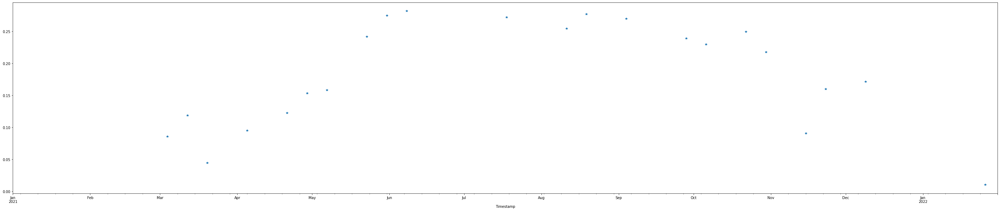

In [13]:
df['NDVI']['2021-01':'2022-01'].plot(marker='*',figsize=(50,10))

In [78]:
df_monthly = df[['NDVI']].resample('M').mean()

<AxesSubplot: xlabel='Timestamp'>

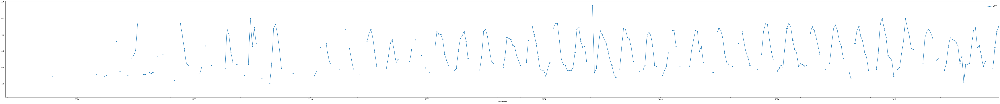

In [ ]:
df_monthly.plot(marker='*',figsize=(40,10))

In [118]:
ndvi = alt.Chart(df_monthly.reset_index()).mark_bar(color='black',size=1).encode(
    alt.X("Timestamp:T"), 
    alt.Y("NDVI:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
(ndvi).properties(width=6000, height=500)

alt.Chart(...)

In [84]:
df_monthly

,NDVI
Timestamp,
1980-12-31,NaN
1981-01-31,NaN
1981-02-28,NaN
1981-03-31,NaN
1981-04-30,NaN
...,...
2023-03-31,NaN
2023-04-30,0.096249
2023-05-31,0.223332


<AxesSubplot: xlabel='Timestamp'>

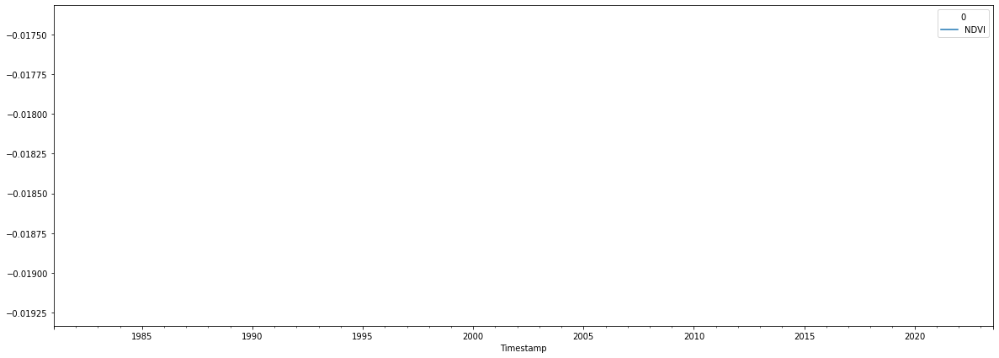

In [22]:
df[['NDVI']].diff(365).plot(figsize=(20,7))

In [382]:
mm = ee.ImageCollection("MODIS/MOD09GA_006_NDVI")

In [320]:
mm.first().getInfo()

{'type': 'Image',
 'bands': [{'id': 'NDVI',
   'data_type': {'type': 'PixelType',
    'precision': 'float',
    'min': -1,
    'max': 1},
   'crs': 'SR-ORG:6974',
   'crs_transform': [463.312716528,
    0,
    -20015109.354,
    0,
    -463.312716527,
    10007554.677]}],
 'version': 1678890886382440.0,
 'id': 'MODIS/MOD09GA_006_NDVI/2000_02_24',
 'properties': {'system:time_start': 951350400000,
  'system:time_end': 951436800000,
  'system:index': '2000_02_24'}}

In [327]:
from src.geometries import all_pastures, id_to_ee_center_point

In [337]:

def get_region_res_to_pd(res):
    
    df = pd.DataFrame(res)
    headers = df.iloc[0]
    df = pd.DataFrame(df.values[1:], columns=headers)

    def add_date_info(df):
        df['Timestamp'] = pd.to_datetime(df['time'], unit='ms')
        df['Year'] = pd.DatetimeIndex(df['Timestamp']).year
        df['Month'] = pd.DatetimeIndex(df['Timestamp']).month
        df['Day'] = pd.DatetimeIndex(df['Timestamp']).day
        df['DOY'] = pd.DatetimeIndex(df['Timestamp']).dayofyear
        return df
    add_date_info(df)
    return df

In [330]:
poi = id_to_ee_center_point(all_pastures,2)

In [333]:
mm.getRegion(poi,10).getInfo()

[['id', 'longitude', 'latitude', 'time', 'NDVI'],
 ['2000_02_24',
  -96.99572755009795,
  44.240455691139225,
  951350400000,
  0.000784537463914603],
 ['2000_02_25', -96.99572755009795, 44.240455691139225, 951436800000, None],
 ['2000_02_26',
  -96.99572755009795,
  44.240455691139225,
  951523200000,
  0.002371228998526931],
 ['2000_02_27',
  -96.99572755009795,
  44.240455691139225,
  951609600000,
  0.24348050355911255],
 ['2000_02_28', -96.99572755009795, 44.240455691139225, 951696000000, None],
 ['2000_02_29',
  -96.99572755009795,
  44.240455691139225,
  951782400000,
  0.05821665748953819],
 ['2000_03_01',
  -96.99572755009795,
  44.240455691139225,
  951868800000,
  0.2729789614677429],
 ['2000_03_02',
  -96.99572755009795,
  44.240455691139225,
  951955200000,
  0.2418670505285263],
 ['2000_03_03',
  -96.99572755009795,
  44.240455691139225,
  952041600000,
  0.26172301173210144],
 ['2000_03_04',
  -96.99572755009795,
  44.240455691139225,
  952128000000,
  0.1140657812356948

In [338]:
df_modis = get_region_res_to_pd(_)

In [340]:
df_modis

,id,longitude,latitude,time,NDVI,Timestamp,Year,Month,Day,DOY
0,2000_02_24,-96.995728,44.240456,951350400000,0.000785,2000-02-24,2000,2,24,55
1,2000_02_25,-96.995728,44.240456,951436800000,None,2000-02-25,2000,2,25,56
2,2000_02_26,-96.995728,44.240456,951523200000,0.002371,2000-02-26,2000,2,26,57
3,2000_02_27,-96.995728,44.240456,951609600000,0.243481,2000-02-27,2000,2,27,58
4,2000_02_28,-96.995728,44.240456,951696000000,None,2000-02-28,2000,2,28,59
...,...,...,...,...,...,...,...,...,...,...
8322,2023_02_13,-96.995728,44.240456,1676246400000,-0.059469,2023-02-13,2023,2,13,44
8323,2023_02_14,-96.995728,44.240456,1676332800000,-0.011146,2023-02-14,2023,2,14,45
8324,2023_02_15,-96.995728,44.240456,1676419200000,-0.006796,2023-02-15,2023,2,15,46
8325,2023_02_16,-96.995728,44.240456,1676505600000,-0.01732,2023-02-16,2023,2,16,47


<AxesSubplot: >

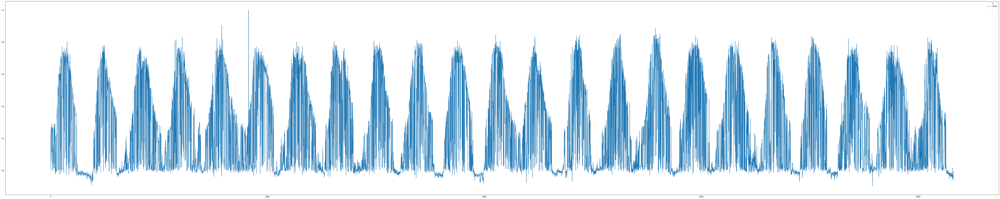

In [343]:
df_modis[['NDVI']].plot(figsize=(100,20))

In [394]:
ndvi_landast = alt.Chart(ndvi_ppt_tempt_pasture_pasture2.iloc[10000:15000]).mark_point(color='red',size=5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI_filled_fb:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
ndvi_modis = alt.Chart(df_modis.iloc[:5000]).mark_point(color='black',size=1).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
(ndvi_landast+ndvi_unscaled).properties(width=3000, height=500)

alt.LayerChart(...)

In [23]:
from statsmodels.tsa.arima.model import ARIMA

In [50]:
preds = []

<AxesSubplot: xlabel='Timestamp'>

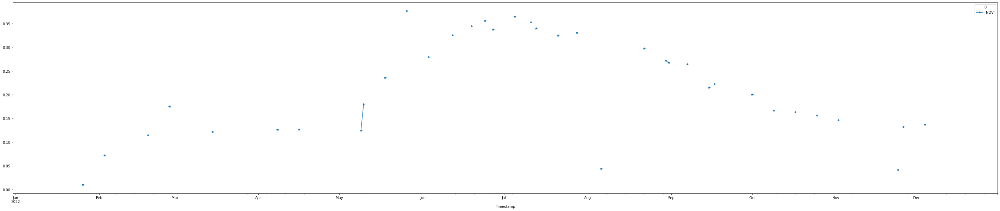

In [446]:
ndvi["2021-12-31":"2022-12-31"].plot(marker='*',figsize=(50,10))

In [2849]:
from statsmodels.tsa.arima.model import ARIMA

origin, start_test, end_test = "1980-12-31", "2021-12-31", "2022-12-31"
ndvi = df[['NDVI']].asfreq("D")
test_period  = pd.date_range(start_test,end_test)
    
    
preds = []
for i in range(365):
    day = test_period[0]
    model = ARIMA(ndvi[origin:day],order = (1,0,0), seasonal_order=(0,0,0,365))
    model = model.fit()
    pred = model.forecast()
    preds.append(pred[0])

preds = pd.Series(preds,index = test_period)
MAE = (preds - df['NDVI']["2021-12-31": "2022-12-31"]).abs().mean()
MAE

KeyboardInterrupt: 

In [60]:
preds

2021-12-31    0.172489
2022-01-01    0.172489
2022-01-02    0.172489
2022-01-03    0.172489
2022-01-04    0.172489
                ...   
2022-12-27    0.172489
2022-12-28    0.172489
2022-12-29    0.172489
2022-12-30    0.172489
2022-12-31    0.172489
Freq: D, Length: 366, dtype: float64

In [71]:
preds = pd.Series(preds,index = test_period)
MAE = (preds - df['NDVI']["2021-12-31": "2022-12-31"]).abs().mean()
MAE

0.0928676381807835

# ARX analysis

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15543 entries, 1980-12-31 to 2023-07-21
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ppt     15543 non-null  object 
 1   tmean   15543 non-null  object 
 2   GDD     15543 non-null  float64
 3   NDVI    564 non-null    float64
dtypes: float64(2), object(2)
memory usage: 1.1+ MB


In [74]:
546/15543

0.03512835359969118

In [100]:
ndvi = alt.Chart(df_monthly.reset_index()).mark_bar(color='black').encode(
    alt.X("Timestamp:T"), 
    alt.Y("NDVI:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)
(ndvi).properties(width=6000, height=500)

alt.Chart(...)

## develop a linear ARX model.
I assume that $y_t = a_t y_{t-1} + \beta X_t + \epsilon_t$ and try to find and learn $a_t$'s and $\beta$

In [1850]:
df_daily['ppt'] = pd.to_numeric(df_daily['ppt'])
df_daily['tmean'] = pd.to_numeric(df_daily['tmean'])


/var/folders/sz/44hp86gj0lq16_fywprf9r580000gn/T/ipykernel_77257/2144844069.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_daily['ppt'] = pd.to_numeric(df_daily['ppt'])
/var/folders/sz/44hp86gj0lq16_fywprf9r580000gn/T/ipykernel_77257/2144844069.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_daily['tmean'] = pd.to_numeric(df_daily['tmean'])


In [1852]:
df_daily.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 564 entries, 1982-12-06 to 2023-07-16
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ppt     564 non-null    float64
 1   tmean   564 non-null    float64
 2   GDD     564 non-null    float64
 3   NDVI    564 non-null    float64
dtypes: float64(4)
memory usage: 22.0 KB


In [513]:
df_monthly = df.resample("M").mean()

In [515]:
df_monthly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 512 entries, 1980-12-31 to 2023-07-31
Freq: M
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ppt     512 non-null    float64
 1   tmean   512 non-null    float64
 2   GDD     512 non-null    float64
 3   NDVI    311 non-null    float64
dtypes: float64(4)
memory usage: 20.0 KB


In [516]:
311/512 *100

60.7421875

In [2788]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 564 entries, 1982-12-06 to 2023-07-16
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ppt     564 non-null    float64
 1   tmean   564 non-null    float64
 2   GDD     564 non-null    float64
 3   NDVI    564 non-null    float64
dtypes: float64(4)
memory usage: 38.2 KB


In [136]:
df_vis

,Timestamp,ppt,tmean,GDD,NDVI
0,1980-12-31,NaN,-1.088000,0.000000,NaN
1,1981-01-31,NaN,-7.692710,0.521548,NaN
2,1981-02-28,NaN,-4.666357,7.051037,NaN
3,1981-03-31,NaN,2.462419,20.485777,NaN
4,1981-04-30,NaN,10.304634,114.286546,NaN
...,...,...,...,...,...
507,2023-03-31,NaN,-5.904497,0.000000,NaN
508,2023-04-30,NaN,5.450403,41.919702,NaN
509,2023-05-31,NaN,16.885864,242.609948,NaN
510,2023-06-30,NaN,21.825503,714.165456,NaN


In [1899]:
df_vis

,Timestamp,ppt,tmean,GDD,NDVI
0,1982-12-06,0.0000,-4.813000,2150.000144,0.961204
1,1984-06-26,0.0000,20.384001,648.988053,2.592369
2,1984-08-29,0.0000,18.185001,1718.644121,5.519687
3,1984-11-01,0.0000,-7.427001,2118.070149,1.207081
4,1985-03-25,0.0000,6.906000,11.654003,0.871415
...,...,...,...,...,...
559,2023-06-12,0.0000,18.026699,651.193881,6.466740
560,2023-06-14,0.0000,21.365400,682.689681,6.220739
561,2023-06-22,32.0942,24.421799,827.075076,7.319853
562,2023-07-08,0.0000,17.128599,1066.076166,7.111600


In [1898]:
df_vis = df_daily.dropna().reset_index()
df_vis['NDVI'] = df_vis['NDVI'] * 20
df_vis['ppt'] = df_vis['ppt'] * 2
tmean = alt.Chart(df_vis).mark_bar(color='red',size=.3).encode(
alt.X("Timestamp:T"), alt.Y("tmean:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('tmean:Q', title='tmean')]
)

precip = alt.Chart(df_vis).mark_bar(color='blue',size=1).encode(
    alt.X("Timestamp:T"), alt.Y("ppt:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('ppt:Q', title='ppt')]
)

ndvi = alt.Chart(df_vis).mark_point(color='black',size=5).encode(
    alt.X("Timestamp:T"), alt.Y("NDVI:Q"),
    tooltip=[
        alt.Tooltip('DOY:O', title='DOY'),
        alt.Tooltip('NDVI:Q', title='NDVI')]
)



(tmean+ precip + ndvi).properties(width=3000, height=400)

alt.LayerChart(...)

In [1900]:
df_monthly['1999-01-01':]

,ppt,tmean,GDD,NDVI
Timestamp,,,,
1999-01-31,0.437613,-11.361678,0.000000,NaN
1999-02-28,0.146393,-2.363536,0.300536,0.069251
1999-03-31,0.707452,0.553710,2.640356,NaN
1999-04-30,3.299967,7.253667,58.995241,NaN
1999-05-31,2.773161,14.300033,252.942957,0.220929
...,...,...,...,...
2023-03-31,0.981316,-5.904497,0.000000,NaN
2023-04-30,0.888080,5.450403,41.919702,0.096249
2023-05-31,1.617939,16.885864,242.609948,0.223332


In [1191]:
def input_output_gen(df,p=6,num_features=3,features=['NDVI','ppt','tmean']):
    data_lenght = len(df)
    X = np.zeros(shape=(data_lenght - p,num_features * p))
    y = np.zeros(shape = (data_lenght - p,))
    feature_arrays = {}
    for f in features:
        feature_arrays[f] = df[f].values
    
    
    for j in range(data_lenght-p):
        X[j,0:p] = feature_arrays[features[0]][j:j+p]
        X[j,p:2*p] = feature_arrays[features[1]][j:j+p]
        X[j,2*p:] = feature_arrays[features[2]][j:j+p]
        y[j] = feature_arrays[features[0]][j+p]

    return X,y

In [1192]:
X,y = input_output_gen(df_monthly.dropna(),p=p)

In [1193]:
X

array([[ 0.04806022,  0.12961845,  0.74738711,  7.95220007, -4.94654867,
        18.78496774],
       [ 0.12961845,  0.27598436,  7.95220007,  1.7093871 , 18.78496774,
        21.85403332],
       [ 0.27598436,  0.06035405,  1.7093871 ,  0.0491    , 21.85403332,
         0.47313332],
       ...,
       [ 0.13723831,  0.09624943,  1.12752253,  0.88807998, -9.97978682,
         5.45040325],
       [ 0.09624943,  0.22333168,  0.88807998,  1.61793866,  5.45040325,
        16.88586417],
       [ 0.22333168,  0.32161173,  1.61793866,  3.81652649, 16.88586417,
        21.82550281]])

In [1194]:
X.shape

(309, 6)

In [1195]:
y.shape

(309,)

In [1196]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15,shuffle=False )
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=42)


In [2835]:
from tensorflow.keras.models import Sequential

In [1197]:
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((222, 6), (222,), (40, 6), (40,), (47, 6), (47,))

In [1198]:
from keras.models import Sequential
from keras.layers import Dense

In [977]:
model = Sequential()
model.add(Dense(1, activation='linear',use_bias=False,input_dim= 9))
model.summary()

Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_100 (Dense)           (None, 1)                 9         
                                                                 
Total params: 9 (36.00 Byte)
Trainable params: 9 (36.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [1199]:
p = 2
num_features = 3
input_dim= p * num_features
model = Sequential()
model.add(Dense(20, activation='relu',use_bias=True,input_dim=input_dim))
model.add(Dense(10,activation='relu'))
model.add(Dense(10,activation='tanh'))
model.add(Dense(5,activation='sigmoid'))
model.add(Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_265 (Dense)           (None, 20)                140       
                                                                 
 dense_266 (Dense)           (None, 10)                210       
                                                                 
 dense_267 (Dense)           (None, 10)                110       
                                                                 
 dense_268 (Dense)           (None, 5)                 55        
                                                                 
 dense_269 (Dense)           (None, 1)                 6         
                                                                 
Total params: 521 (2.04 KB)
Trainable params: 521 (2.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [1209]:
model.compile(loss = 'mse', metrics=['mse'],optimizer='adam')
history=model.fit(X_train, y_train, epochs=1500, validation_data=(X_val,y_val),batch_size=32,verbose=0,callbacks=[early_stopping])

train loss : 0.009880953468382359. validation loss : 0.011164313182234764


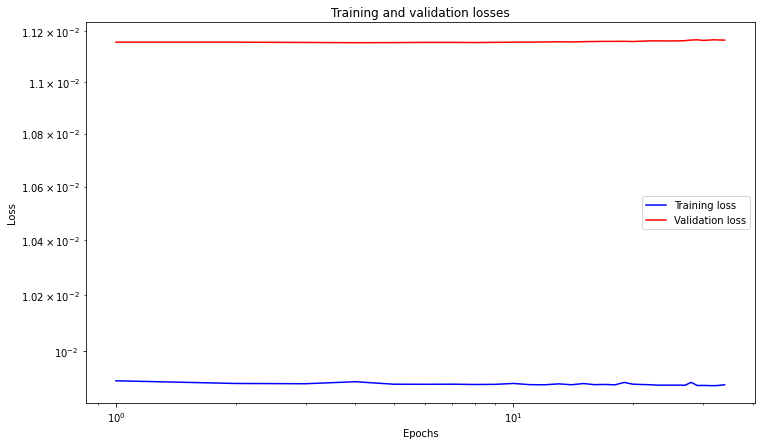

In [1210]:
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs=range(1,len(loss)+1)
plt.figure(figsize=(12,7))
plt.plot(epochs, loss,'b', label='Training loss')
plt.plot(epochs, val_loss,'r', label='Validation loss')
plt.title('Training and validation losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xscale('log')
plt.yscale('log')
plt.legend()
# plt.savefig('loss_curves.png')
#plt.show()
print(f"train loss : {loss[-1]}. validation loss : {val_loss[-1]}")

In [1211]:
model_prediction = model.predict(X_test)

2/2 [==============================] - 0s 3ms/step


In [1212]:
mean_squared_error(y_test,model_prediction)


0.009812717097206445

In [1213]:
r2_score(y_test,model_prediction)

-0.0028700692138921013

In [1188]:
model_prediction[:2]

array([[0.11752475],
       [0.08957471]], dtype=float32)

In [1189]:
model.predict(X_test[:2])

1/1 [==============================] - 0s 238ms/step


array([[0.11539286],
       [0.1078941 ]], dtype=float32)

In [1190]:
X_test[:2]

array([[ 0.28700785,  0.17439783,  3.49359999,  1.82064514, 16.16596738,
         5.66729068],
       [ 0.17439783,  0.15896533,  1.82064514,  1.02459998,  5.66729068,
        -3.79253357]])

In [982]:
y_test_df= pd.DataFrame(y_test,columns=['y_test'])
model_prediction_df = pd.DataFrame(model_prediction,columns=['preds'])
y_test_df_plot = alt.Chart(y_test_df.reset_index()).mark_line(color='green',opacity=.5, size=1,point={
      "filled": True,
      "fill": "black",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("index:Q"), 
    alt.Y("y_test:Q"),
    tooltip=[
        alt.Tooltip('y_test:O', title='NDVI')]
)
model_prediction_plot = alt.Chart(model_prediction_df.shift(0).reset_index()).mark_line(color='blue',size=1,point={
      "filled": True,
      "fill": "blue",
    "size" : 50
    }).encode(
    alt.X("index:Q"), 
    alt.Y("preds:Q"),
    tooltip=[
        alt.Tooltip('preds:O', title='NDVI_prediction')]
)

(y_test_df_plot + model_prediction_plot).properties(width=1000, height=500)

alt.LayerChart(...)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

In [1050]:
from tensorflow.keras.callbacks import EarlyStopping

In [2668]:
def arx_model(df,
              model,
              number_epochs=1000, 
              p_feats=(2,2),
              p_res=2,
              features=['ppt','tmean'],
              response = 'NDVI',
              test_size = 0.1,
              val_size = 0.1,
              shuffle_test = False):
#     # function for generating data
#     def input_output_gen(df,p=p,num_features=3,features=['NDVI','ppt','tmean']):
#         data_lenght = len(df)
#         X = np.zeros(shape=(data_lenght - p,num_features * p))
#         y = np.zeros(shape = (data_lenght - p,))
#         feature_arrays = {}
#         for f in features:
#             feature_arrays[f] = df[f].values


#         for j in range(data_lenght-p):
#             X[j,0:p] = feature_arrays[features[0]][j:j+p]
#             X[j,p:2*p] = feature_arrays[features[1]][j:j+p]
#             X[j,2*p:] = feature_arrays[features[2]][j:j+p]
#             y[j] = feature_arrays[features[0]][j+p]

#         return X,y
#     # data
#     def features_sw(df,p, features):    
#         f1_sw = sliding_window_view(df[features[0]].values,p)
#         f2_sw = sliding_window_view(df[features[1]].values,p)

#         X_features = np.hstack((f1_sw,f2_sw))
#         return X_features

#     def features_sw(df, features, past_windows): 
#         max_p = max(past_windows)
#         drops = [max_p - p for p in past_windows]      
#         feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,past_windows,drops)]
#         X_features = np.hstack(feature_sws)
#         return X_features

#     def slide_view_feats_res(df=df,p = p,features=features,response=response):  


#         ndvi_sw = sliding_window_view(df[response].values,p)

#         X_features = features_sw(df=df,features=features,past_windows=(p,p))

#         X = np.hstack((ndvi_sw,X_features))[:-1]
#         y = df[response].values[p:]

#         return X,y


#     def features_sw(df, features,res, p_feats,p_res): 
    
#         max_p = max(*p_feats,p_res+1)
#         drops_feats = [max_p - p for p in p_feats] 
#         drop_res = max_p - p_res
#         feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
#         res_sw = sliding_window_view(df[res].shift(1).values[drop_res:],p_res)
#         feature_sws.append(res_sw)
#         X= np.hstack(feature_sws)
#         y = df[res].values[max_p-1:]
#         assert len(y) == len(X)
#         return X,y
    def features_sw(df, features,res, p_feats,p_res): 

        max_p = max(*p_feats,p_res+1)
        drops_feats = [max_p - p for p in p_feats] 
        drop_res = max_p - p_res
        sws = [sliding_window_view(df[res].shift(1).values[drop_res:],p_res)]
        feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
        sws.extend(feature_sws)
        X= np.hstack(sws)
        y = df[res].values[max_p-1:]
        assert len(y) == len(X)
        return X,y
    

    X,y = features_sw(df=df,features=features,res=response,p_feats=p_feats,p_res=p_res)
    # X,y = input_output_gen(df_monthly.dropna())
    

# X,y = input_output_gen(df_monthly.dropna())
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,shuffle=shuffle_test)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = val_size, random_state=42)
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1,shuffle=False)
    # X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
    #model
    
    
    
    model.compile(loss = 'mean_squared_error', metrics=['mean_squared_error'],optimizer='adam')
    history=model.fit(X_train, y_train, epochs=number_epochs, validation_data=(X_val,y_val),batch_size=32,verbose=0,callbacks=[early_stopping])
    #evualation
    train_loss=history.history['loss']
    val_loss=history.history['val_loss']
    model_prediction = model.predict(X_test)
    test_loss = mean_squared_error(y_test,model_prediction)
    r2 = r2_score(y_test,model_prediction)
    
    # # forecast log term
    # X_features_test = np.hsplit(X_test,(sum(p_feats),input_dimension))[0]
    # first_window = X_test[0][:p]
    # ndvis = first_window
    # for i in range(len(y_test)):
    #     x = np.hstack((ndvis[-p:],X_features_test[i])).reshape(1,input_dimension)
    #     pred = model.predict(x,verbose=0)[0][0]
    #     ndvis = np.append(ndvis,pred)
    # long_term_forecast = ndvis[p:]
    # long_term_loss = mean_squared_error(y_test,long_term_forecast)
    # long_term_r2 = r2_score(y_test,long_term_forecast)
    
    print(f"train loss : {train_loss[-1]}. validation loss : {val_loss[-1]}. test_loss : {test_loss}. r2 : {r2}.") 

    

    long_term_forecast = None
    if p_res > 0:
        first_window = X_test[0][:p_res]
        input_dimension = p_res+ sum(p_feats)
        X_features_test = np.hsplit(X_test,(p_res,input_dimension))[1]

        ndvis = first_window
        for i in range(len(y_test)):
            x = np.hstack((ndvis[-p_res:],X_features_test[i])).reshape(1,input_dimension)
            pred = model.predict(x,verbose=0)[0][0]
            ndvis = np.append(ndvis,pred)
        long_term_forecast = ndvis[p_res:]
        long_term_loss = mean_squared_error(y_test,long_term_forecast)
        long_term_r2 = r2_score(y_test,long_term_forecast)
        print(f"long term loss: {long_term_loss}. long term r2: {long_term_r2}")
    
    
    return model, history, X_test, y_test, model_prediction, long_term_forecast

In [2722]:
p_feats=(2,2)
p_res=2
input_dimension = sum(p_feats) + p_res
model = Sequential()
model.add(Dense(1, activation='linear',use_bias=True,input_dim= input_dimension))
model.summary()

Model: "sequential_205"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_485 (Dense)           (None, 1)                 7         
                                                                 
Total params: 7 (28.00 Byte)
Trainable params: 7 (28.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [2513]:
p_feats=(0,0)
p_res=3
input_dimension = sum(p_feats) + p_res
model = Sequential()
model.add(Dense(120, activation='sigmoid',use_bias=True,input_dim=input_dimension))
# model.add(Dense(10,activation='relu'))
# model.add(Dense(10,activation='tanh'))
# model.add(Dense(5,activation='sigmoid'))
model.add(Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_198"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_475 (Dense)           (None, 120)               480       
                                                                 
 dense_476 (Dense)           (None, 1)                 121       
                                                                 
Total params: 601 (2.35 KB)
Trainable params: 601 (2.35 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [2723]:
model, history, X_test, y_test, model_prediction, long_term_forecast = arx_model(df_daily.dropna(),model,p_feats=p_feats,p_res=p_res,number_epochs=1000)

2/2 [==============================] - 0s 2ms/step
train loss : 0.002989673288539052. validation loss : 0.0026867480482906103. test_loss : 0.0037182674948209285. r2 : 0.6045040127158248.
long term loss: 0.0036552906020042375. long term r2: 0.6112025916737183


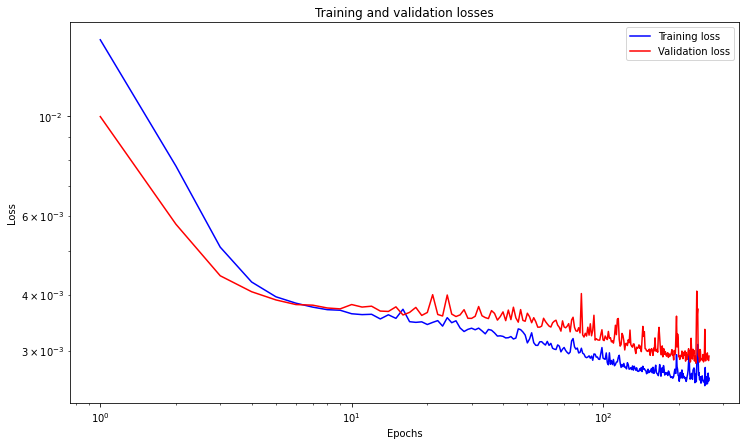

In [2724]:
epochs=range(1,len(train_loss)+1)
plt.figure(figsize=(12,7))
plt.plot(epochs, train_loss,'b', label='Training loss')
plt.plot(epochs, val_loss,'r', label='Validation loss')
plt.title('Training and validation losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xscale('log')
plt.yscale('log')
plt.legend()

In [2742]:
df_daily.reset_index().dropna().iloc[-len(y_test):]

,Timestamp,ppt,tmean,GDD,NDVI
507,2021-08-19,8.623799,25.935900,1771.636434,0.277265
508,2021-09-04,0.000000,17.602999,2007.224128,0.270118
509,2021-09-28,0.000000,22.446499,2302.845716,0.239301
510,2021-10-06,0.000000,16.238699,2399.192112,0.229788
511,2021-10-22,0.382400,4.378300,2498.828207,0.249773
512,2021-10-30,0.000000,5.882500,2510.871305,0.217923
513,2021-11-15,0.000000,1.604400,2530.007404,0.090747
514,2021-11-23,0.000000,7.102100,2534.659704,0.160269
515,2021-12-09,0.000000,1.106800,2537.350203,0.171311
516,2022-01-26,0.000000,-6.727800,0.000000,0.010216


In [2741]:
df_daily.reset_index().dropna().iloc[-len(y_test):]['NDVI'].values == y_test

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [2739]:
df_daily.reset_index().dropna().iloc[-len(y_test):]['NDVI'].values

array([0.2772651 , 0.27011839, 0.23930126, 0.22978823, 0.249773  ,
       0.21792325, 0.09074741, 0.16026868, 0.17131141, 0.01021557,
       0.07200243, 0.11532282, 0.1748088 , 0.12142478, 0.12603389,
       0.12723454, 0.124982  , 0.18064916, 0.23587141, 0.37646934,
       0.27931794, 0.3257006 , 0.34516222, 0.35569536, 0.33737025,
       0.36453745, 0.35311866, 0.33980698, 0.32473348, 0.33101027,
       0.04425041, 0.29757459, 0.27206665, 0.26762861, 0.26390246,
       0.21546792, 0.22240411, 0.20053806, 0.16721865, 0.16311331,
       0.15691945, 0.14631831, 0.04146724, 0.13192097, 0.13723831,
       0.09372538, 0.09877348, 0.15634121, 0.19701745, 0.24679528,
       0.29317278, 0.28608031, 0.32333701, 0.31103695, 0.36599265,
       0.35557999, 0.34688263])

In [2736]:
y_test

array([0.2772651 , 0.27011839, 0.23930126, 0.22978823, 0.249773  ,
       0.21792325, 0.09074741, 0.16026868, 0.17131141, 0.01021557,
       0.07200243, 0.11532282, 0.1748088 , 0.12142478, 0.12603389,
       0.12723454, 0.124982  , 0.18064916, 0.23587141, 0.37646934,
       0.27931794, 0.3257006 , 0.34516222, 0.35569536, 0.33737025,
       0.36453745, 0.35311866, 0.33980698, 0.32473348, 0.33101027,
       0.04425041, 0.29757459, 0.27206665, 0.26762861, 0.26390246,
       0.21546792, 0.22240411, 0.20053806, 0.16721865, 0.16311331,
       0.15691945, 0.14631831, 0.04146724, 0.13192097, 0.13723831,
       0.09372538, 0.09877348, 0.15634121, 0.19701745, 0.24679528,
       0.29317278, 0.28608031, 0.32333701, 0.31103695, 0.36599265,
       0.35557999, 0.34688263])

In [2715]:
df_test = df_daily.dropna().iloc[-(len(y_test)+1):-1]

In [2727]:
y_test_df

,y_test
0,0.277265
1,0.270118
2,0.239301
3,0.229788
4,0.249773
5,0.217923
6,0.090747
7,0.160269
8,0.171311
9,0.010216


In [2721]:
df_test.reset_index()['NDVI']

0     0.254774
1     0.277265
2     0.270118
3     0.239301
4     0.229788
5     0.249773
6     0.217923
7     0.090747
8     0.160269
9     0.171311
10    0.010216
11    0.072002
12    0.115323
13    0.174809
14    0.121425
15    0.126034
16    0.127235
17    0.124982
18    0.180649
19    0.235871
20    0.376469
21    0.279318
22    0.325701
23    0.345162
24    0.355695
25    0.337370
26    0.364537
27    0.353119
28    0.339807
29    0.324733
30    0.331010
31    0.044250
32    0.297575
33    0.272067
34    0.267629
35    0.263902
36    0.215468
37    0.222404
38    0.200538
39    0.167219
40    0.163113
41    0.156919
42    0.146318
43    0.041467
44    0.131921
45    0.137238
46    0.093725
47    0.098773
48    0.156341
49    0.197017
50    0.246795
51    0.293173
52    0.286080
53    0.323337
54    0.311037
55    0.365993
56    0.355580
Name: NDVI, dtype: float64

In [2746]:
len(df_all) == len(preds_df) == len(y_test_df) == len(model_prediction_df)

True

In [2756]:
long_term_preds_df['Timestamp'] = df_all.reset_index()['Timestamp']

In [2808]:
df_with_all_values =df[df_all.iloc[0]['Timestamp']:].reset_index()
df_with_all_values['ppt_scaled'] = .02 * df_with_all_values['ppt'] 
df_with_all_values['tmean_scaled'] = .01 * df_with_all_values['tmean']
df_all_NDVI = alt.Chart(df_with_all_values).mark_point(color='black',opacity=1, size=3).encode(
    alt.X("Timestamp:T"), 
    alt.Y("NDVI:Q")
)


df_all_ppt = alt.Chart(df_with_all_values).mark_bar(color='blue',opacity=1, size=1.5).encode(
    alt.X("Timestamp:T"), 
    alt.Y("ppt_scaled:Q")
)



df_all_tmean = alt.Chart(df_with_all_values).mark_bar(color='red',opacity=.5, size=1.5).encode(
    alt.X("Timestamp:T"), 
    alt.Y("tmean_scaled:Q")
)

(df_all_ppt+ df_all_tmean+ df_all_NDVI).properties(width=1000, height=500)

alt.LayerChart(...)

In [2792]:
df[df_all.iloc[0]['Timestamp']:]

,ppt,tmean,GDD,NDVI
Timestamp,,,,
2021-08-19,8.623799,25.9359,1771.636434,0.277265
2021-08-20,40.708099,20.1299,1786.766334,NaN
2021-08-21,0,16.9112,1798.677533,NaN
2021-08-22,15.2934,18.387899,1812.065433,NaN
2021-08-23,0,23.2136,1830.279033,NaN
...,...,...,...,...
2023-07-17,0,16.9524,1194.623461,NaN
2023-07-18,0.461,20.289099,1209.912560,NaN
2023-07-19,0,21.441299,1226.353859,NaN


In [2832]:
# 




df_all = df_daily.reset_index().dropna().iloc[-len(y_test):]

df_with_all_values =df[df_all.iloc[0]['Timestamp']:].reset_index()
df_with_all_values['ppt_scaled'] = .02 * df_with_all_values['ppt'] 
df_with_all_values['tmean_scaled'] = .01 * df_with_all_values['tmean']

df_all_NDVI = alt.Chart(df_with_all_values).mark_point(color='black',opacity=1, size=5).encode(
    alt.X("Timestamp:T"), 
    alt.Y("NDVI:Q")
)


df_all_ppt = alt.Chart(df_with_all_values).mark_bar(color='blue',opacity=1, size=1.5).encode(
    alt.X("Timestamp:T"), 
    alt.Y("ppt_scaled:Q")
)



df_all_tmean = alt.Chart(df_with_all_values).mark_bar(color='red',opacity=.5, size=1.5).encode(
    alt.X("Timestamp:T"), 
    alt.Y("tmean_scaled:Q")
)



long_term_preds_df = pd.DataFrame(long_term_forecast,columns=['preds_all_time'])
y_test_df= pd.DataFrame(y_test,columns=['y_test'])
model_prediction_df = pd.DataFrame(model_prediction,columns=['preds'])


long_term_preds_df['Timestamp'] = df_all.reset_index()['Timestamp']
y_test_df['Timestamp'] = df_all.reset_index()['Timestamp']
model_prediction_df['Timestamp'] = df_all.reset_index()['Timestamp']



# yy_test = alt.Chart(df_test.reset_index()).mark_bar(color='black',opacity=1, size=30).encode(
#     alt.X("index:Q"), 
#     alt.Y("NDVI:Q")
# )



y_test_df_plot = alt.Chart(y_test_df.reset_index()).mark_line(color='black',opacity=1, size=1,point={
      "filled": True,
      "fill": "black",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("Timestamp:T"), 
    alt.Y("y_test:Q"),
    tooltip=[
        alt.Tooltip('y_test:O', title='NDVI')]
)
model_prediction_plot = alt.Chart(model_prediction_df.shift(0).reset_index()).mark_line(color='lime',opacity=1,size=1,point={
      "filled": True,
      "fill": "lime",
    "size" : 50
    }).encode(
    alt.X("Timestamp:T"), 
    alt.Y("preds:Q"),
    tooltip=[
        alt.Tooltip('preds:O', title='NDVI_prediction')]
)

preds_all_time_df_plot = alt.Chart(long_term_preds_df.reset_index()).mark_line(color='red',opacity=1, size=1,point={
      "filled": True,
      "fill": "red",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("Timestamp:T"), 
    alt.Y("preds_all_time:Q"),
    tooltip=[
        alt.Tooltip('preds_all_time:O', title='NDVI')]
)

(df_all_ppt+ df_all_tmean+ df_all_NDVI+ preds_all_time_df_plot + y_test_df_plot + model_prediction_plot).properties(width=1000, height=500)

alt.LayerChart(...)

In [2825]:


y_test_df_plot = alt.Chart(y_test_df.reset_index()).mark_line(color='black',opacity=1, size=2,point={
      "filled": True,
      "fill": "black",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("index:Q"), 
    alt.Y("y_test:Q"),
    tooltip=[
        alt.Tooltip('y_test:O', title='NDVI')]
)
model_prediction_plot = alt.Chart(model_prediction_df.shift(0).reset_index()).mark_line(color='blue',opacity=1,size=2,point={
      "filled": True,
      "fill": "blue",
    "size" : 50
    }).encode(
    alt.X("index:Q"), 
    alt.Y("preds:Q"),
    tooltip=[
        alt.Tooltip('preds:O', title='NDVI_prediction')]
)

preds_all_time_df_plot = alt.Chart(long_term_preds_df.reset_index()).mark_line(color='red',opacity=1, size=2,point={
      "filled": True,
      "fill": "black",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("index:Q"), 
    alt.Y("preds_all_time:Q"),
    tooltip=[
        alt.Tooltip('preds_all_time:O', title='NDVI')]
)

(preds_all_time_df_plot + y_test_df_plot + model_prediction_plot).properties(width=1000, height=500)

alt.LayerChart(...)

In [2684]:
len(X_test)

57

In [2685]:
len(y_test)

57

In [2686]:
precs  = np.hsplit(X_test,(p_res,p_res+1))[1]

In [2687]:
temps = np.hsplit(X_test,(p_res+p_feats[0],p_res+p_feats[0]+1))[1]

In [2688]:
df_daily.dropna()['ppt'].values[-(len(y_test)+1):-1] == precs.flatten()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [2689]:
df_daily.dropna()['tmean'].values[-(len(y_test)+1):-1] == temps.flatten()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [2690]:
df_daily.dropna()['ppt'].values[-(len(y_test)+1):-1]

array([0.00000000e+00, 8.62379932e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 3.82399976e-01, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 7.23599970e-01, 1.49980993e+01, 0.00000000e+00,
       8.99999985e-04, 5.68199992e-01, 7.13569975e+00, 0.00000000e+00,
       0.00000000e+00, 3.27679992e+00, 0.00000000e+00, 5.93599975e-01,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       6.58909988e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.04460001e+00, 0.00000000e+00, 0.00000000e+00, 4.92569971e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.60471001e+01,
      

In [2692]:
df_daily.dropna().iloc[-(len(y_test)+1):-1]

,ppt,tmean,GDD,NDVI
Timestamp,,,,
2021-08-11,0.000000,23.273499,1629.651938,0.254774
2021-08-19,8.623799,25.935900,1771.636434,0.277265
2021-09-04,0.000000,17.602999,2007.224128,0.270118
2021-09-28,0.000000,22.446499,2302.845716,0.239301
2021-10-06,0.000000,16.238699,2399.192112,0.229788
2021-10-22,0.382400,4.378300,2498.828207,0.249773
2021-10-30,0.000000,5.882500,2510.871305,0.217923
2021-11-15,0.000000,1.604400,2530.007404,0.090747
2021-11-23,0.000000,7.102100,2534.659704,0.160269


In [2592]:
df = df_daily.dropna()

p_feats=(2,2)

p_res=2

input_dimension = sum(p_feats) + p_res

model = Sequential()
model.add(Dense(120, activation='sigmoid',use_bias=True,input_dim=input_dimension))
model.add(Dense(1,activation='sigmoid'))

number_epochs=1000 

features=['ppt','tmean']

response = 'NDVI' 

In [2649]:
#         return X,y
def features_sw(df, features,res, p_feats,p_res): 
    
    assert sum(p_feats) + p_res > 0 
    max_p = max(*p_feats,p_res+1)
    drops_feats = [max_p - p for p in p_feats] 
    drop_res = max_p - p_res
    sws = [sliding_window_view(df[res].shift(1).values[drop_res:],p_res)]
    feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
    sws.extend(feature_sws)
    X= np.hstack(sws)
    y = df[res].values[max_p-1:]
    assert len(y) == len(X)
    return X,y

In [2656]:
X,y = features_sw(df=df,features=features,res=response,p_feats=p_feats,p_res=p_res)

In [2657]:
test_size = .1
val_size = 0.1
shuffle_test = False
# X,y = input_output_gen(df_monthly.dropna())
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,shuffle=shuffle_test)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = val_size, random_state=42)
#model
    


In [2596]:

model.compile(loss = 'mean_squared_error', metrics=['mean_squared_error'],optimizer='adam')

early_stopping = EarlyStopping(patience=30)

history=model.fit(X_train, y_train, epochs=number_epochs, validation_data=(X_val,y_val),batch_size=32,verbose=0,callbacks=[early_stopping])
#evualation
train_loss=history.history['loss']
val_loss=history.history['val_loss']
model_prediction = model.predict(X_test)
test_loss = mean_squared_error(y_test,model_prediction)
r2 = r2_score(y_test,model_prediction)

2/2 [==============================] - 0s 3ms/step


In [2597]:
print(f"train loss : {train_loss[-1]}. validation loss : {val_loss[-1]}. test_loss : {test_loss}. r2 : {r2}.") 


train loss : 0.0026038694195449352. validation loss : 0.002917167264968157. test_loss : 0.0018958678875171293. r2 : 0.8078107445210211.


In [2598]:
long_term_forecast = None
if p_res > 0:
    first_window = X_test[0][:p_res]
    input_dimension = p_res+ sum(p_feats)
    X_features_test = np.hsplit(X_test,(p_res,input_dimension))[1]

    # ndvis = first_window
    for i in range(len(y_test)):
        x = np.hstack((first_window[-p_res:],X_features_test[i])).reshape(1,input_dimension)
        pred = model.predict(x,verbose=0)[0][0]
        first_window = np.append(first_window,pred)
    long_term_forecast = first_window[p_res:]
    long_term_loss = mean_squared_error(y_test,long_term_forecast)
    long_term_r2 = r2_score(y_test,long_term_forecast)
    print(f"long term loss: {long_term_loss}. long term r2: {long_term_r2}")

long term loss: 0.004199258458284205. long term r2: 0.5743098124213815


In [2423]:
y_test

array([0.2772651 , 0.27011839, 0.23930126, 0.22978823, 0.249773  ,
       0.21792325, 0.09074741, 0.16026868, 0.17131141, 0.01021557,
       0.07200243, 0.11532282, 0.1748088 , 0.12142478, 0.12603389,
       0.12723454, 0.124982  , 0.18064916, 0.23587141, 0.37646934,
       0.27931794, 0.3257006 , 0.34516222, 0.35569536, 0.33737025,
       0.36453745, 0.35311866, 0.33980698, 0.32473348, 0.33101027,
       0.04425041, 0.29757459, 0.27206665, 0.26762861, 0.26390246,
       0.21546792, 0.22240411, 0.20053806, 0.16721865, 0.16311331,
       0.15691945, 0.14631831, 0.04146724, 0.13192097, 0.13723831,
       0.09372538, 0.09877348, 0.15634121, 0.19701745, 0.24679528,
       0.29317278, 0.28608031, 0.32333701, 0.31103695, 0.36599265,
       0.35557999, 0.34688263])

In [2424]:
X_test

array([[ 8.62379932e+00,  2.59358997e+01],
       [ 0.00000000e+00,  1.76029987e+01],
       [ 0.00000000e+00,  2.24464989e+01],
       [ 0.00000000e+00,  1.62386990e+01],
       [ 3.82399976e-01,  4.37829971e+00],
       [ 0.00000000e+00,  5.88249969e+00],
       [ 0.00000000e+00,  1.60439992e+00],
       [ 0.00000000e+00,  7.10209990e+00],
       [ 0.00000000e+00,  1.10679996e+00],
       [ 0.00000000e+00, -6.72779989e+00],
       [ 0.00000000e+00, -1.72672997e+01],
       [ 0.00000000e+00, -7.37539959e+00],
       [ 0.00000000e+00, -2.45159984e+00],
       [ 0.00000000e+00,  5.80579996e+00],
       [ 0.00000000e+00,  1.25230002e+00],
       [ 0.00000000e+00, -8.72699976e-01],
       [ 0.00000000e+00,  1.72749996e+01],
       [ 0.00000000e+00,  1.81096992e+01],
       [ 0.00000000e+00,  1.69568996e+01],
       [ 0.00000000e+00,  1.49151001e+01],
       [ 7.23599970e-01,  1.59349995e+01],
       [ 1.49980993e+01,  2.50269985e+01],
       [ 0.00000000e+00,  2.99113998e+01],
       [ 8.

In [2427]:
p_feats=(1,1)
p_res=0
np.hsplit(X_test,(p_res,p_res+ sum(p_feats)))[1]

array([[ 8.62379932e+00,  2.59358997e+01],
       [ 0.00000000e+00,  1.76029987e+01],
       [ 0.00000000e+00,  2.24464989e+01],
       [ 0.00000000e+00,  1.62386990e+01],
       [ 3.82399976e-01,  4.37829971e+00],
       [ 0.00000000e+00,  5.88249969e+00],
       [ 0.00000000e+00,  1.60439992e+00],
       [ 0.00000000e+00,  7.10209990e+00],
       [ 0.00000000e+00,  1.10679996e+00],
       [ 0.00000000e+00, -6.72779989e+00],
       [ 0.00000000e+00, -1.72672997e+01],
       [ 0.00000000e+00, -7.37539959e+00],
       [ 0.00000000e+00, -2.45159984e+00],
       [ 0.00000000e+00,  5.80579996e+00],
       [ 0.00000000e+00,  1.25230002e+00],
       [ 0.00000000e+00, -8.72699976e-01],
       [ 0.00000000e+00,  1.72749996e+01],
       [ 0.00000000e+00,  1.81096992e+01],
       [ 0.00000000e+00,  1.69568996e+01],
       [ 0.00000000e+00,  1.49151001e+01],
       [ 7.23599970e-01,  1.59349995e+01],
       [ 1.49980993e+01,  2.50269985e+01],
       [ 0.00000000e+00,  2.99113998e+01],
       [ 8.

In [2428]:
X_test[0]

array([ 8.62379932, 25.93589973])

In [2429]:
X_test[0][:p_res]

array([], dtype=float64)

In [2390]:
first_window = X_test[0][:p_res]

In [2391]:
first_window

array([0.22495914, 0.28186157])

In [2393]:

X_features_test = np.hsplit(X_test,(p_res,p_res+ sum(p_feats)))[1]
input_dimension = p_res+ sum(p_feats)
ndvis = first_window
for i in range(len(y_test)):
    x = np.hstack((ndvis[-p_res:],X_features_test[i])).reshape(1,input_dimension)
    pred = model.predict(x,verbose=0)[0][0]
    ndvis = np.append(ndvis,pred)
long_term_forecast = ndvis[p_res:]
long_term_loss = mean_squared_error(y_test,long_term_forecast)
long_term_r2 = r2_score(y_test,long_term_forecast)

In [1982]:
max(np.array([1,2,6,4,5])) - np.array([1,2,6,4,5]) 

array([5, 4, 0, 2, 1])

In [2070]:
dffff = pd.DataFrame({'dd':[10,20,30,40,50,60,70], 'ff': [1,2,3,4,5,6,7],'nn':[100,200,300,400,500,600,700]})

In [2072]:
def features_sw(df, features, past_windows): 
    max_p = max(past_windows)
    drops = [max_p - p for p in past_windows]      
    feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,past_windows,drops)]
    X_features = np.hstack(feature_sws)
    return X_features

In [2179]:
# def features_sw(df, features, past_windows): 
    
#     max_p = max(*past_windows[:-1],past_windows[-1]+1)
#     drops = [max_p - p for p in past_windows]      
#     feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features[:-1],past_windows[:-1],drops[:-1])]
#     res_sw = sliding_window_view(df[features[-1]].shift(1).values[drops[-1]:],past_windows[-1])
#     feature_sws.append(res_sw)
#     X_features = np.hstack(feature_sws)[:-1]
#     # y = df[response].values[p:]
#     return X_features

In [2348]:
def features_sw(df, features,res, p_feats,p_res): 
    
    max_p = max(*p_feats,p_res+1)
    drops_feats = [max_p - p for p in p_feats] 
    drop_res = max_p - p_res
    sws = [sliding_window_view(df[res].shift(1).values[drop_res:],p_res)]
    feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
    sws.extend(feature_sws)
    X= np.hstack(sws)
    y = df[res].values[max_p-1:]
    assert len(y) == len(X)
    return X,y

In [2349]:
dffff

,dd,ff,nn
0,10,1,100
1,20,2,200
2,30,3,300
3,40,4,400
4,50,5,500
5,60,6,600
6,70,7,700


In [2378]:
Xx = features_sw(dffff,['dd','ff'],'nn',[3,3],2)[0]

In [2379]:
Xx

array([[100., 200.,  10.,  20.,  30.,   1.,   2.,   3.],
       [200., 300.,  20.,  30.,  40.,   2.,   3.,   4.],
       [300., 400.,  30.,  40.,  50.,   3.,   4.,   5.],
       [400., 500.,  40.,  50.,  60.,   4.,   5.,   6.],
       [500., 600.,  50.,  60.,  70.,   5.,   6.,   7.]])

In [2380]:
np.hsplit(Xx,(p_res,p_res+ sum(p_feats)))[1]

array([[10., 20., 30.,  1.,  2.,  3.],
       [20., 30., 40.,  2.,  3.,  4.],
       [30., 40., 50.,  3.,  4.,  5.],
       [40., 50., 60.,  4.,  5.,  6.],
       [50., 60., 70.,  5.,  6.,  7.]])

In [2362]:
np.hsplit(Xx,(3,7))[0]

array([[100., 200., 300.],
       [200., 300., 400.],
       [300., 400., 500.],
       [400., 500., 600.]])

In [2365]:
np.hsplit(Xx,(3,7+3))[1]

array([[20., 30., 40.,  1.,  2.,  3.,  4.],
       [30., 40., 50.,  2.,  3.,  4.,  5.],
       [40., 50., 60.,  3.,  4.,  5.,  6.],
       [50., 60., 70.,  4.,  5.,  6.,  7.]])

In [2256]:
features_sw(dffff,['dd','ff'],'nn',[3,4],0)[1]

array([400, 500, 600, 700])

In [2153]:
def slide_view_feats_res(df,features, past_windows_features, response, past_window_res):  

    max_p = max(*past_windows_features,past_window_res+1)
    drops = [max_p - p for p in past_windows_features] 

    if past_window_res < 
    
    res_sw = sliding_window_view(df[response].values,past_window_res)

    # X_features = features_sw(df=df,features=features,past_windows=(p,p))

    X = np.hstack(feature_sws)
    y = df[response].values[p:]

    return X,y

SyntaxError: invalid syntax (1184817631.py, line 6)

In [ ]:
slide_view_feats_res(dffff,['dd','ff'],(2,3),'nn',2)[0]

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (2, 5) + inhomogeneous part.

In [2016]:
np.hstack(([[1,2,3],[3,4,5]]))

array([1, 2, 3, 3, 4, 5])

In [1988]:
df.dropna()

,ppt,tmean,GDD,NDVI
Timestamp,,,,
1982-12-06,0,-4.813,2150.000144,0.048060
1984-06-26,0,20.384001,648.988053,0.129618
1984-08-29,0,18.185001,1718.644121,0.275984
1984-11-01,0,-7.427001,2118.070149,0.060354
1985-03-25,0,6.906,11.654003,0.043571
...,...,...,...,...
2023-06-12,0,18.026699,651.193881,0.323337
2023-06-14,0,21.3654,682.689681,0.311037
2023-06-22,16.0471,24.421799,827.075076,0.365993


In [2836]:
def features_sw(df, features,res, p_feats,p_res): 

    max_p = max(*p_feats,p_res+1)
    drops_feats = [max_p - p for p in p_feats] 
    drop_res = max_p - p_res
    sws = [sliding_window_view(df[res].shift(1).values[drop_res:],p_res)]
    feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
    sws.extend(feature_sws)
    X= np.hstack(sws)
    y = df[res].values[max_p-1:]
    assert len(y) == len(X)
    return X,y

In [2837]:
dffff

,dd,ff,nn
0,10,1,100
1,20,2,200
2,30,3,300
3,40,4,400
4,50,5,500
5,60,6,600
6,70,7,700


In [2838]:
features_sw(dffff,['dd','ff'],'nn',(2,2),2)

(array([[100., 200.,  20.,  30.,   2.,   3.],
       [200., 300.,  30.,  40.,   3.,   4.],
       [300., 400.,  40.,  50.,   4.,   5.],
       [400., 500.,  50.,  60.,   5.,   6.],
       [500., 600.,  60.,  70.,   6.,   7.]]), array([300, 400, 500, 600, 700]))

In [2044]:
features_sw(dffff,features=['dd','ff'],past_windows=(0,2))

array([[1, 2],
       [2, 3],
       [3, 4],
       [4, 5],
       [5, 6],
       [6, 7]])

In [ ]:
features_sw(df.dropna(),features=['ppt','tmean'])

In [1724]:
p=2
first_window = X_test[0][:p]
ndvis = first_window
for i in range(len(y_test)):
    x = np.hstack((ndvis[-p:],X_features[i])).reshape(1,3*p)
    pred = model.predict(x,verbose=0)[0][0]
    # print(pred)
    ndvis = np.append(ndvis,pred)
    

In [1726]:
len(ndvis)

49

In [1729]:
y_test

array([ 0.15896533,  0.14588703,  0.04452911,  0.08948793,  0.09971687,
        0.18635934,  0.26223934,  0.40049387,  0.34115778,  0.29269708,
        0.21520766,  0.21025499, -0.05429118,  0.12663126,  0.2820392 ,
        0.31871988,  0.33574806,  0.31262204,  0.28117705,  0.14622392,
        0.15366799,  0.08300429,  0.12374017,  0.22495914,  0.28186157,
        0.27226019,  0.26601966,  0.25470982,  0.23249483,  0.12550804,
        0.17131141,  0.01021557,  0.12071135,  0.12142478,  0.12663421,
        0.22949298,  0.32864927,  0.34264137,  0.22038006,  0.23392483,
        0.17194737,  0.10656884,  0.13723831,  0.09624943,  0.22333168,
        0.32161173,  0.35123131])

In [1728]:
ndvis

array([0.28700785, 0.17439783, 0.11917236, 0.10796961, 0.13471788,
       0.13577275, 0.1826835 , 0.24397376, 0.25940722, 0.26244172,
       0.26925981, 0.23040628, 0.23636465, 0.16427366, 0.12493942,
       0.11500277, 0.18669838, 0.24499899, 0.27696246, 0.25697908,
       0.21990663, 0.17713773, 0.13349488, 0.11843361, 0.1775358 ,
       0.21572773, 0.23261151, 0.24340951, 0.24210081, 0.23061952,
       0.20863596, 0.18246113, 0.13986276, 0.12246799, 0.11817168,
       0.13839036, 0.18127602, 0.2148833 , 0.25036702, 0.2539894 ,
       0.24282429, 0.21567619, 0.18612853, 0.15717664, 0.13784683,
       0.11938399, 0.18971345, 0.25305825, 0.27797413])

In [1309]:
preds = model_prediction.flatten()

In [1312]:
preds[0]

0.16277726

In [1316]:
X_test[1][1] = preds[0]

In [1318]:
X_test[1]

array([ 0.17439783,  0.16277726,  1.82064514,  1.02459998,  5.66729068,
       -3.79253357])

In [1323]:
pred = model.predict(X_test[1:2],verbose=0)[0][0]

In [1324]:
pred

-0.006898433

In [1388]:
X_test_new = X_test

In [1346]:
len(X_test)

47

In [1386]:
preds = [model_prediction.flatten()[0]]

In [1389]:
for i in range(1,len(y_test)):
    X_test_new[i][1] = preds[i-1]
    pred = model.predict(X_test_new[i:i+1],verbose=0)[0][0]
    preds.append(pred)
    if i < len(y_test)-1:
        X_test_new[i+1][0] = preds[i-1]

In [ ]:
p=3
for i in range(1,len(y_test)):
    X_test_new[i][2] = preds[i-1]
    pred = model.predict(X_test_new[i:i+1],verbose=0)[0][0]
    preds.append(pred)
    if i < len(y_test)-1:
        X_test_new[i+1][1] = preds[i-1]
        if i > 1:
            X_test_new[i+1][0] = preds[i-2]
            # X_test_new[i+1][0:2] = preds[i-2:i-1]
        
    

In [1470]:
def input_output_gen_for_prediction(df,p=p,num_features=3,features=['NDVI','ppt','tmean']):
    data_lenght = len(df)
    
    # response = df[responses].values
    
    
    
    
    X = np.zeros(shape=(data_lenght - p,num_features * p))
    y = np.zeros(shape = (data_lenght - p,))
    feature_arrays = {}
    for f in features:
        feature_arrays[f] = df[f].values


    for j in range(data_lenght-p):
        X[j,0:p] = feature_arrays[features[0]][j:j+p]
        X[j,p:2*p] = feature_arrays[features[1]][j:j+p]
        X[j,2*p:] = feature_arrays[features[2]][j:j+p]
        y[j] = feature_arrays[features[0]][j+p]

    return X,y

In [1403]:
from numpy.lib.stride_tricks import sliding_window_view

In [1471]:
df = df.dropna()

In [1781]:
def features_sw(df,p, features):    
    f1_sw = sliding_window_view(df[features[0]].values,p)
    f2_sw = sliding_window_view(df[features[1]].values,p)

    X_features = np.hstack((f1_sw,f2_sw))
    return X_features
    
def slide_view_feats_res(df,p = 2,features=['ppt','tmean'],response='NDVI'):  
    

    ndvi_sw = sliding_window_view(df[response].values,p)
    
    

#     ppt_sw = sliding_window_view(df[features[0]].values,p)
#     temp_sw = sliding_window_view(df[features[1]].values,p)
    X_features = features_sw(df=df,p=p, features=features)
    
    X = np.hstack((ndvi_sw,X_features))[:-1]
    y = df[response].values[p:]
    
    return X,y

In [ ]:
def features_sw(df,p=2, features=['ppt','tmean']):    
    f1_sw = sliding_window_view(df[features[0]].values,p)
    f2_sw = sliding_window_view(df[features[1]].values,p)
    
    X_features = np.hstack((f1_sw,f2_sw))[:-1]
    return X_features

In [1780]:
p = 8
assert (slide_view_feats_res(df,p=p)[1] == input_output_gen_for_prediction(df,p=p)[1]).all()
assert (slide_view_feats_res(df,p=p)[0] == input_output_gen_for_prediction(df,p=p)[0]).all()

In [1586]:
X, y = slide_view_feats_res(df,p=3,just_first_window_res=False)

0.31687394

In [1676]:
len(y_test)

47

In [ ]:
p = 2
for i in range(1,len(y_test)):
    X_test_new[i][1] = preds[i-1]
    pred = model.predict(X_test_new[i:i+1],verbose=0)[0][0]
    preds.append(pred)
    if i < len(y_test)-1:
        X_test_new[i+1][0] = preds[i-1]

In [ ]:
# p=3
for i in range(len(X)-p):
    pred = model.predict(X_test_new[i:i+1],verbose=0)[0][0]
    
    for j in range(1,p+1):
        X[i+j][p-j] = pred

   

    X[i+1][p-1] = pred
    X[i+2][p-2] = pred
    X[i+3][p-3] = pred
    # X[i][p-1] = preds[i-1]
    pred = model.predict(X_test_new[i:i+1],verbose=0)[0][0]
    preds.append(pred)
    if i < len(y_test)-1:
        X[i+1][1] = pred
        if i > 1:
            X_test_new[i+1][0] = preds[i-2]
            # X_test_new[i+1][0:2] = preds[i-2:i-1]
        
    

In [1575]:
def features_sw(df,p=2, features=['ppt','tmean']):    
    f1_sw = sliding_window_view(df[features[0]].values,p)
    f2_sw = sliding_window_view(df[features[1]].values,p)
    
    X_features = np.hstack((f1_sw,f2_sw))[:-1]
    return X_features

In [1603]:
a = np.array([1,2,3,4,5,6,5])

In [1613]:
a[-3:]

array([5, 6, 5])

In [1621]:
p=2
first_window = df['NDVI'].values[:p]

In [1610]:
ndvis = first_window

In [1617]:
ndvis[-p:]

array([0.04806022, 0.12961845])

In [1618]:
X_feats[0]

array([ 0.        ,  0.        , -4.8130002 , 20.38400078])

In [1637]:
df = df_monthly.dropna()

In [1680]:
p=2
# first_window = df['NDVI'].values[:p]
first_window = y_test[:p]
ndvis = first_window
for i in range(len(y_test)):
    x = np.hstack((ndvis[-p:],X_feats[i])).reshape(1,3*p)
    pred = model.predict(x,verbose=0)[0][0]
    # print(pred)
    ndvis = np.append(ndvis,pred)
    

In [1681]:
ndvis_df = pd.DataFrame(ndvis,columns=['NNDVI'])

In [1683]:
nndvis = alt.Chart(ndvis_df.reset_index()).mark_line(color='green',opacity=.5, size=1,point={
      "filled": True,
      "fill": "black",
    "size" : 50,
    'opacity' : .5
    }).encode(
    alt.X("index:Q"), 
    alt.Y("NNDVI:Q"),
    tooltip=[
        alt.Tooltip('y_test:O', title='NDVI')]
)
(nndvis).properties(width=1000, height=500)

alt.Chart(...)

In [1664]:
a = np.array([])
for i in range(10):
    a = np.append(a,i)

In [1665]:
a

array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.])

In [1639]:
ndvis

array([0.04806022, 0.12961845])

In [1627]:
pred = model.predict(x,verbose=0)[0][0]

In [1630]:
pred

0.31687394

In [1629]:
np.append(ndvis,pred)

array([0.04806022, 0.12961845, 0.31687394])

In [1596]:
X_test_new[0:0+1].shape

(1, 6)

In [1592]:
X_feats = features_sw(df,p=2)

In [1589]:
X_feats[0]

array([ 0.        ,  0.        ,  0.        , -4.8130002 , 20.38400078,
       18.18500137])

In [1588]:
len(X_feats)

561

In [1587]:
len(X)

561

In [1574]:

for j in range(1,p+1):
    print(f"X[i+{j}][p-{j}] = pred")

X[i+1][p-1] = pred
X[i+2][p-2] = pred
X[i+3][p-3] = pred


In [1571]:
for j in range(p-1,-1,-1):
    print(j)

2
1
0


In [1572]:
for j in range(p):
    print(j)

0
1
2


In [1568]:
len(X)

562

In [1382]:
X_test

array([[  0.28700785,   0.17439783,   3.49359999,   1.82064514,
         16.16596738,   5.66729068],
       [  0.17439783,   0.13114345,   1.82064514,   1.02459998,
          5.66729068,  -3.79253357],
       [  0.13114345,   0.09121355,   1.02459998,   0.80987095,
         -3.79253357,  -5.41880669],
       [  0.09121355,   0.1188266 ,   0.80987095,   0.71745162,
         -5.41880669, -11.82767803],
       [  0.1188266 ,   0.07407831,   0.71745162,   2.2487419 ,
        -11.82767803,  -4.06663248],
       [  0.07407831,   0.18113245,   2.2487419 ,   4.19673336,
         -4.06663248,   6.22538318],
       [  0.18113245,   0.24494886,   4.19673336,   4.18487097,
          6.22538318,  11.60214163],
       [  0.24494886,   0.24740607,   4.18487097,   3.69176665,
         11.60214163,  19.76881282],
       [  0.24740607,   0.28455779,   3.69176665,   6.08758068,
         19.76881282,  22.15488637],
       [  0.28455779,   0.2846204 ,   6.08758068,   3.40919356,
         22.15488637,  19.2

In [1366]:
preds

[0.13114345,
 0.091213554,
 0.1188266,
 0.07407831,
 0.18113245,
 0.24494886,
 0.24740607,
 0.2845578,
 0.2846204,
 0.23096004,
 0.25596514,
 0.12238797,
 0.114558175,
 0.088406876,
 0.22281644,
 0.23346207,
 0.2883661,
 0.24957302,
 0.22821602,
 0.17077918,
 0.09656931,
 0.09620286,
 0.19466406,
 0.19521478,
 0.23236099,
 0.26524478,
 0.23984668,
 0.23750272,
 0.20541517,
 0.16813429,
 0.11093652,
 0.09125081,
 0.0794176,
 0.1135838,
 0.17439324,
 0.19357431,
 0.2627522,
 0.2635726,
 0.25033048,
 0.22052252,
 0.18843222,
 0.13356829,
 0.103403986,
 0.07148066,
 0.2345384,
 0.2590948,
 0.2719392]

In [1325]:
X_test

array([[ 2.87007847e-01,  1.74397831e-01,  3.49359999e+00,
         1.82064514e+00,  1.61659674e+01,  5.66729068e+00],
       [ 1.74397831e-01,  1.62777260e-01,  1.82064514e+00,
         1.02459998e+00,  5.66729068e+00, -3.79253357e+00],
       [ 1.58965334e-01,  1.45887035e-01,  1.02459998e+00,
         8.09870946e-01, -3.79253357e+00, -5.41880669e+00],
       [ 1.45887035e-01,  4.45291065e-02,  8.09870946e-01,
         7.17451618e-01, -5.41880669e+00, -1.18276780e+01],
       [ 4.45291065e-02,  8.94879322e-02,  7.17451618e-01,
         2.24874190e+00, -1.18276780e+01, -4.06663248e+00],
       [ 8.94879322e-02,  9.97168666e-02,  2.24874190e+00,
         4.19673336e+00, -4.06663248e+00,  6.22538318e+00],
       [ 9.97168666e-02,  1.86359337e-01,  4.19673336e+00,
         4.18487097e+00,  6.22538318e+00,  1.16021416e+01],
       [ 1.86359337e-01,  2.62239344e-01,  4.18487097e+00,
         3.69176665e+00,  1.16021416e+01,  1.97688128e+01],
       [ 2.62239344e-01,  4.00493872e-01,  3.691

In [1266]:
y_preds = []
for i in range(1,len(X_test)):
    X_test[2][0]
    y_pred = model.predict(X_test[0:i],verbose=0)[0][0]
    y_preds.append(y_pred)
    X_test[i][1] = y_pred
    
    

In [1277]:
X[2]

array([ 0.27598436,  0.06035405,  1.7093871 ,  0.0491    , 21.85403332,
        0.47313332])

In [1265]:
model.predict(X_test[0:1],verbose=0)[0][0]

0.11819199

In [1247]:
X_test[0]

array([ 0.28700785,  0.17439783,  3.49359999,  1.82064514, 16.16596738,
        5.66729068])

In [2851]:
ndvi_ppt_tempt_pasture_ctwd4 = pd.read_csv('./ndvi_ppt_tempt_pasture_ctwd4.csv')

In [2852]:
ndvi_ppt_tempt_pasture_ctwd4

,Unnamed: 0,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD
0,0,19810101,-101.849415,43.941227,347112000000,1.810000,9.428000,-5.808000,0.0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000
1,1,19810102,-101.849415,43.941227,347198400000,-1.893000,3.977000,-7.764000,0.0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000
2,2,19810103,-101.849415,43.941227,347284800000,-0.549000,9.504000,-10.602000,0.0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000
3,3,19810104,-101.849415,43.941227,347371200000,-3.754000,3.375000,-10.883000,0.0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000
4,4,19810105,-101.849415,43.941227,347457600000,-4.703000,0.272000,-9.679000,0.0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15566,15566,20230815,-101.849415,43.941227,1692014400000,18.735300,26.578600,10.892200,0.0,2023-08-14,2023,8,14,226,0.241827,13.735300,1667.664637
15567,15567,20230816,-101.849415,43.941227,1692100800000,24.603699,34.825397,14.382100,0.0,2023-08-15,2023,8,15,227,NaN,19.603699,1687.268335
15568,15568,20230817,-101.849415,43.941227,1692187200000,23.907598,36.373398,11.441999,0.0,2023-08-16,2023,8,16,228,NaN,18.907598,1706.175934
15569,15569,20230818,-101.849415,43.941227,1692273600000,21.076500,29.303200,12.849999,0.0,2023-08-17,2023,8,17,229,NaN,16.076500,1722.252434


In [2911]:
ndvi_ppt_tempt_pasture_ctwd4

,Unnamed: 0,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD
0,0,19810101,-101.849415,43.941227,347112000000,1.810000,9.428000,-5.808000,0.0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000
1,1,19810102,-101.849415,43.941227,347198400000,-1.893000,3.977000,-7.764000,0.0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000
2,2,19810103,-101.849415,43.941227,347284800000,-0.549000,9.504000,-10.602000,0.0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000
3,3,19810104,-101.849415,43.941227,347371200000,-3.754000,3.375000,-10.883000,0.0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000
4,4,19810105,-101.849415,43.941227,347457600000,-4.703000,0.272000,-9.679000,0.0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15566,15566,20230815,-101.849415,43.941227,1692014400000,18.735300,26.578600,10.892200,0.0,2023-08-14,2023,8,14,226,0.241827,13.735300,1667.664637
15567,15567,20230816,-101.849415,43.941227,1692100800000,24.603699,34.825397,14.382100,0.0,2023-08-15,2023,8,15,227,NaN,19.603699,1687.268335
15568,15568,20230817,-101.849415,43.941227,1692187200000,23.907598,36.373398,11.441999,0.0,2023-08-16,2023,8,16,228,NaN,18.907598,1706.175934
15569,15569,20230818,-101.849415,43.941227,1692273600000,21.076500,29.303200,12.849999,0.0,2023-08-17,2023,8,17,229,NaN,16.076500,1722.252434


In [2917]:
ndvi_ppt_tempt_pasture_ctwd4[ndvi_ppt_tempt_pasture_ctwd4['Month'].isin([1,2,12])]

,Unnamed: 0,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD
0,0,19810101,-101.849415,43.941227,347112000000,1.810000,9.428000,-5.8080,0.0,1980-12-31,1980,12,31,366,NaN,0.0,0.0000
1,1,19810102,-101.849415,43.941227,347198400000,-1.893000,3.977000,-7.7640,0.0,1981-01-01,1981,1,1,1,NaN,0.0,0.0000
2,2,19810103,-101.849415,43.941227,347284800000,-0.549000,9.504000,-10.6020,0.0,1981-01-02,1981,1,2,2,NaN,0.0,0.0000
3,3,19810104,-101.849415,43.941227,347371200000,-3.754000,3.375000,-10.8830,0.0,1981-01-03,1981,1,3,3,NaN,0.0,0.0000
4,4,19810105,-101.849415,43.941227,347457600000,-4.703000,0.272000,-9.6790,0.0,1981-01-04,1981,1,4,4,NaN,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15395,15395,20230225,-101.849415,43.941227,1677240000000,-14.265599,-5.193400,-23.3379,0.0,2023-02-24,2023,2,24,55,NaN,0.0,1.2368
15396,15396,20230226,-101.849415,43.941227,1677326400000,-4.298700,4.626200,-13.2238,0.0,2023-02-25,2023,2,25,56,NaN,0.0,1.2368
15397,15397,20230227,-101.849415,43.941227,1677412800000,0.076200,8.286099,-8.1336,0.0,2023-02-26,2023,2,26,57,NaN,0.0,1.2368
15398,15398,20230228,-101.849415,43.941227,1677499200000,0.313300,5.646000,-5.0194,0.0,2023-02-27,2023,2,27,58,NaN,0.0,1.2368


In [2918]:
def add_season(df):
    def season(month):
        season = {
            12:'Winter', 1:'Winter', 2:'Winter',
            3:'Spring', 4:'Spring', 5:'Spring',
            6:'Summer', 7:'Summer', 8:'Summer',
            9:'Autumn', 10:'Autumn', 11:'Autumn'}
        return season.get(month)

    df['season'] = df['Month'].apply(season)
    return df

add_season(ndvi_ppt_tempt_pasture_ctwd4)

In [2919]:
add_season(ndvi_ppt_tempt_pasture_ctwd4)

,Unnamed: 0,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,season
0,0,19810101,-101.849415,43.941227,347112000000,1.810000,9.428000,-5.808000,0.0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,Winter
1,1,19810102,-101.849415,43.941227,347198400000,-1.893000,3.977000,-7.764000,0.0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,Winter
2,2,19810103,-101.849415,43.941227,347284800000,-0.549000,9.504000,-10.602000,0.0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,Winter
3,3,19810104,-101.849415,43.941227,347371200000,-3.754000,3.375000,-10.883000,0.0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,Winter
4,4,19810105,-101.849415,43.941227,347457600000,-4.703000,0.272000,-9.679000,0.0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15566,15566,20230815,-101.849415,43.941227,1692014400000,18.735300,26.578600,10.892200,0.0,2023-08-14,2023,8,14,226,0.241827,13.735300,1667.664637,Summer
15567,15567,20230816,-101.849415,43.941227,1692100800000,24.603699,34.825397,14.382100,0.0,2023-08-15,2023,8,15,227,NaN,19.603699,1687.268335,Summer
15568,15568,20230817,-101.849415,43.941227,1692187200000,23.907598,36.373398,11.441999,0.0,2023-08-16,2023,8,16,228,NaN,18.907598,1706.175934,Summer
15569,15569,20230818,-101.849415,43.941227,1692273600000,21.076500,29.303200,12.849999,0.0,2023-08-17,2023,8,17,229,NaN,16.076500,1722.252434,Summer


In [2926]:
def add_past_season_sum_feasture(df,feature,season):
    season_feature = df[df['season']== season].groupby('Year')[feature].sum()
    df[f'past_{season}_{feature}'] = df['Year'].map(season_feature)
add_past_season_sum_feasture(ndvi_ppt_tempt_pasture_ctwd4,'ppt','Winter')

In [2923]:
winter_ppt

Year
1980     0.000000
1981     9.938000
1982    22.240000
1983    15.843000
1984     8.493000
1985    26.783000
1986    29.727000
1987    74.631000
1988    41.128000
1989    28.265000
1990    18.075000
1991    40.078999
1992    46.900000
1993    53.379001
1994    27.066000
1995    30.597000
1996    51.489000
1997    52.470000
1998    29.128000
1999    23.630000
2000    38.310000
2001    46.440999
2002    13.488000
2003    29.674000
2004    32.464000
2005    27.587001
2006    24.951000
2007    25.608000
2008    38.950000
2009    65.196000
2010    38.380000
2011    47.224000
2012    24.077000
2013    46.992000
2014    18.973000
2015    34.225001
2016    30.353000
2017    38.017000
2018    52.624001
2019    51.214001
2020    22.382000
2021    39.323699
2022    36.623899
2023    38.857999
Name: ppt, dtype: float64

In [2924]:
ndvi_ppt_tempt_pasture_ctwd4['past_winter_ppt'] = ndvi_ppt_tempt_pasture_ctwd4['Year'].map(winter_ppt)

In [2928]:
ndvi_ppt_tempt_pasture_ctwd4

,Unnamed: 0,id,longitude,latitude,time,tmean,tmax,tmin,ppt,Timestamp,Year,Month,Day,DOY,NDVI,GD,GDD,season,past_winter_ppt,past_Winter_ppt
0,0,19810101,-101.849415,43.941227,347112000000,1.810000,9.428000,-5.808000,0.0,1980-12-31,1980,12,31,366,NaN,0.000000,0.000000,Winter,0.000000,0.000000
1,1,19810102,-101.849415,43.941227,347198400000,-1.893000,3.977000,-7.764000,0.0,1981-01-01,1981,1,1,1,NaN,0.000000,0.000000,Winter,9.938000,9.938000
2,2,19810103,-101.849415,43.941227,347284800000,-0.549000,9.504000,-10.602000,0.0,1981-01-02,1981,1,2,2,NaN,0.000000,0.000000,Winter,9.938000,9.938000
3,3,19810104,-101.849415,43.941227,347371200000,-3.754000,3.375000,-10.883000,0.0,1981-01-03,1981,1,3,3,NaN,0.000000,0.000000,Winter,9.938000,9.938000
4,4,19810105,-101.849415,43.941227,347457600000,-4.703000,0.272000,-9.679000,0.0,1981-01-04,1981,1,4,4,NaN,0.000000,0.000000,Winter,9.938000,9.938000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15566,15566,20230815,-101.849415,43.941227,1692014400000,18.735300,26.578600,10.892200,0.0,2023-08-14,2023,8,14,226,0.241827,13.735300,1667.664637,Summer,38.857999,38.857999
15567,15567,20230816,-101.849415,43.941227,1692100800000,24.603699,34.825397,14.382100,0.0,2023-08-15,2023,8,15,227,NaN,19.603699,1687.268335,Summer,38.857999,38.857999
15568,15568,20230817,-101.849415,43.941227,1692187200000,23.907598,36.373398,11.441999,0.0,2023-08-16,2023,8,16,228,NaN,18.907598,1706.175934,Summer,38.857999,38.857999
15569,15569,20230818,-101.849415,43.941227,1692273600000,21.076500,29.303200,12.849999,0.0,2023-08-17,2023,8,17,229,NaN,16.076500,1722.252434,Summer,38.857999,38.857999


In [2863]:
df0 = ndvi_ppt_tempt_pasture_ctwd4.sort_values('Timestamp').set_index('Timestamp')[['ppt','tmean','GDD','NDVI','DOY']]

In [2871]:
df0['past_precipitation'] = df0['ppt'].rolling(window=30,min_periods=10).sum()

In [2873]:
df0.dropna()

,ppt,tmean,GDD,NDVI,DOY,past_precipitation
Timestamp,,,,,,
1982-11-16,0.000000,-0.486000,2300.786160,0.058633,320,10.478000
1984-04-12,0.000000,8.141001,48.363007,0.056732,103,35.695000
1984-05-14,0.000000,17.002001,161.903018,0.121112,135,60.313999
1984-07-08,3.005000,24.107000,861.340066,0.239052,190,85.610999
1984-07-17,0.000000,21.020000,1024.191074,0.215959,199,36.696000
...,...,...,...,...,...,...
2023-07-12,0.000000,21.668200,1082.703459,0.255922,193,65.547199
2023-07-21,0.000000,22.601999,1232.481752,0.235643,202,74.350799
2023-07-28,0.640700,23.767899,1383.254648,0.210282,209,46.219099


In [2939]:
df_test = pd.DataFrame({'d':[10,20,30,40,50,60],'res':[1,2,3,4,5,6]})

In [2875]:
w_size = 3

In [2876]:
df_test['cum_window'] = df_test['d'].rolling(window=w_size,min_periods=1).sum()

In [2930]:
df_test

,d,cum_window,past_arrays,past_arrays_series
0,10,10.0,[10],"0 10 Name: d, dtype: int64"
1,20,30.0,"[10, 20]","0 10 1 20 Name: d, dtype: int64"
2,30,60.0,"[10, 20, 30]","0 10 1 20 2 30 Name: d, dtype: int64"
3,40,90.0,"[20, 30, 40]","1 20 2 30 3 40 Name: d, dtype: int64"
4,50,120.0,"[30, 40, 50]","2 30 3 40 4 50 Name: d, dtype: int64"
5,60,150.0,"[40, 50, 60]","3 40 4 50 5 60 Name: d, dtype: int64"


In [2905]:
df_test['past_arrays'] = [np.array(window) for window in df_test.d.rolling(window=w_size,min_periods=3)]

# df_test['d'].rolling(window=w_size,min_periods=3).apply(lambda x:x.to_list())

In [2908]:
df_test['past_arrays_series'] = pd.Series(df_test.d.rolling(window=w_size,min_periods=3)) 

In [2910]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   d                   6 non-null      int64  
 1   cum_window          6 non-null      float64
 2   past_arrays         6 non-null      object 
 3   past_arrays_series  6 non-null      object 
dtypes: float64(1), int64(1), object(2)
memory usage: 320.0+ bytes


In [2906]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   d            6 non-null      int64  
 1   cum_window   6 non-null      float64
 2   past_arrays  6 non-null      object 
dtypes: float64(1), int64(1), object(1)
memory usage: 272.0+ bytes


In [2896]:
rolling = df_test['d'].rolling(window=w_size,min_periods=3)

In [2897]:
for i in rolling:
    print(i.tolist())

[10]
[10, 20]
[10, 20, 30]
[20, 30, 40]
[30, 40, 50]
[40, 50, 60]


In [2929]:
def features_sw(df, features,p_feats): 

    max_p = max(*p_feats,p_res+1)
    drops_feats = [max_p - p for p in p_feats] 
    # drop_res = max_p - p_res
    # sws = [sliding_window_view(df[res].shift(1).values[drop_res:],p_res)]
    feature_sws = [sliding_window_view(df[f].values[d:],p) for f,p,d in zip(features,p_feats,drops_feats)]
    # sws.extend(feature_sws)
    X= np.hstack(feature_sws)
    # y = df[res].values[max_p-1:]
    # assert len(y) == len(X)
    return X


In [2940]:
df_test

,d,res
0,10,1
1,20,2
2,30,3
3,40,4
4,50,5
5,60,6


In [2941]:
def sw_res_feats(df,res = 'NDVI', features=['ppt','tmean'],p_res=1,p_feats=(2,2)):
    res_values = df[res].values
    features_values = [df[f].values for f in features]
    v = []
    for index,res in enumerate(res_values):
            if ~np.isnan(res):
                ll = [l[index-p+1:index+1] for l,p in zip(features_values,p_feats)]
                v.append((index,res,ll))

    res = [i[1]for i in v]
    res_sw = sliding_window_view([i[1]for i in v],p_res)[:-1]
    features_sw = [np.array([v[i][2][j] for i in range(p_res,len(v))]) for j in range(len(features))]
    X = np.hstack([res_sw,*features_sw])
    y = np.array(res)[p_res:]
    assert len(X) == len(y)
    return X,y

In [2943]:
sw_res_feats(df_test,res='res',features=['d'],p_res=1,p_feats=(2,))

(array([[ 1, 10, 20],
       [ 2, 20, 30],
       [ 3, 30, 40],
       [ 4, 40, 50],
       [ 5, 50, 60]]), array([2, 3, 4, 5, 6]))

In [2967]:
[np.array(i) for i in df_test.d.rolling(window=3,min_periods=None)]

[array([10]), array([10, 20]), array([10, 20, 30]), array([20, 30, 40]), array([30, 40, 50]), array([40, 50, 60])]

In [ ]:
np.array(df_test.d.rolling(window=3,min_periods=None))

array(Rolling [window=3,center=False,axis=0,method=single], dtype=object)

In [2938]:
features_sw(df_test,['d'],[2])

array([[20, 30],
       [30, 40],
       [40, 50],
       [50, 60]])

In [2975]:
df_test['sw_feats'] = pd.Series(df_test.d.rolling(window=2,min_periods=None)) 

In [2976]:
df_test['sw_res'] = pd.Series(df_test.res.shift(1).rolling(window=1,min_periods=None)) 

In [2980]:
df_test

,d,res,sw_feats,sw_res
0,10,1,"0 10 Name: d, dtype: int64","0 NaN Name: res, dtype: float64"
1,20,2,"0 10 1 20 Name: d, dtype: int64","1 1.0 Name: res, dtype: float64"
2,30,3,"1 20 2 30 Name: d, dtype: int64","2 2.0 Name: res, dtype: float64"
3,40,4,"2 30 3 40 Name: d, dtype: int64","3 3.0 Name: res, dtype: float64"
4,50,5,"3 40 4 50 Name: d, dtype: int64","4 4.0 Name: res, dtype: float64"
5,60,6,"4 50 5 60 Name: d, dtype: int64","5 5.0 Name: res, dtype: float64"


In [2981]:
df_test[['sw_feats','sw_res']][1:].to_numpy()

array([[0    10
        1    20
        Name: d, dtype: int64, 1    1.0
                               Name: res, dtype: float64],
       [1    20
        2    30
        Name: d, dtype: int64, 2    2.0
                               Name: res, dtype: float64],
       [2    30
        3    40
        Name: d, dtype: int64, 3    3.0
                               Name: res, dtype: float64],
       [3    40
        4    50
        Name: d, dtype: int64, 4    4.0
                               Name: res, dtype: float64],
       [4    50
        5    60
        Name: d, dtype: int64, 5    5.0
                               Name: res, dtype: float64]], dtype=object)